# Setup

In [1]:
import os
import base64
from IPython import display
from PIL import Image
import json
from decimal import Decimal
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from dotenv import load_dotenv
from langchain_openai import ChatOpenAI
from langchain_core.messages import SystemMessage, HumanMessage, AIMessage
from langchain_openai import ChatOpenAI
from langchain.prompts import ChatPromptTemplate
from langchain_core.pydantic_v1 import BaseModel, Field
from langchain_core.output_parsers import JsonOutputParser, PydanticOutputParser
import open_clip
from langchain_experimental.open_clip import OpenCLIPEmbeddings
from sklearn.metrics.pairwise import cosine_similarity

In [2]:
# load env variables from .env
load_dotenv()

True

# Completely Unplanned Demo

In [4]:
llm = ChatOpenAI(model='gpt-4o', temperature=0.0)

In [5]:
response = llm.invoke('Tell me a joke about pirates')
print(response.content)

Sure, here's a pirate joke for you:

Why did the pirate go to the Apple Store?

Because he wanted to trade his iPatch for an iPad!


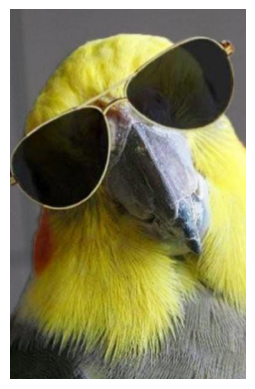

'/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAJBAXADASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwDle9Hej+KjoaYE8fQVKajj+7UmKQxD0pc0cUHigApMUtFMBMUhNOzSYoATA9KWijvQAlGaUjijFAg6ijJAxQBil70DADHSilo60AGaKKMUAFLg0Y5oxQAnWl6UYoNAC0UlLQAUUoFIPvUgE/Cl47UpHNHPegBMj0ozng0uKKY

In [6]:
def encode_image_base64(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')
    
def display_image(image_uri):
    image = Image.open(image_uri)
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    
# See the image we're working with
image_uri = "./Images/1548d06a49fccb050deaf74b443a0a59.jpg"
display_image(image_uri)

# Encode the image
encoded_image = encode_image_base64(image_uri)
encoded_image

In [7]:
message = HumanMessage(content=[
        {
            # The text input explaining to the model what we want it to do
            "type": "text", 
            "text": "Provide a list of tags for this image."
        },
        {
            # The image input
            "type": "image_url",
            "image_url": {"url": f"data:image/jpeg;base64,{encoded_image}"},
        }
])

In [8]:
prompt=[message]
response=llm.invoke(prompt)
print(response.content)

Here are some tags for the image:

- Parrot
- Bird
- Sunglasses
- Cool
- Funny
- Yellow feathers
- Aviator sunglasses
- Animal
- Pet
- Stylish
- Close-up
- Headshot
- Quirky
- Fashionable


In [9]:
class ImageInfo(BaseModel):
    '''Description and Tags for an Image'''
    description: str = Field(description = "description of the image.")
    tags: list[str] = Field(description = "tags for the image.")

In [11]:
json_output_parser = JsonOutputParser(pydantic_object=ImageInfo)
pydantic_output_parser = PydanticOutputParser(pydantic_object=ImageInfo)

In [12]:
print(json_output_parser.get_format_instructions())

The output should be formatted as a JSON instance that conforms to the JSON schema below.

As an example, for the schema {"properties": {"foo": {"title": "Foo", "description": "a list of strings", "type": "array", "items": {"type": "string"}}}, "required": ["foo"]}
the object {"foo": ["bar", "baz"]} is a well-formatted instance of the schema. The object {"properties": {"foo": ["bar", "baz"]}} is not well-formatted.

Here is the output schema:
```
{"description": "Description and Tags for an Image", "properties": {"description": {"title": "Description", "description": "description of the image.", "type": "string"}, "tags": {"title": "Tags", "description": "tags for the image.", "type": "array", "items": {"type": "string"}}}, "required": ["description", "tags"]}
```


In [13]:
format_instructions = pydantic_output_parser.get_format_instructions()
message = HumanMessage(content=[
        {
            "type": "text", 
            "text": "Provide a description and a list of tags for this image."
        },
        {
            "type": "text", 
            "text": f"{format_instructions}"
        },
        {
            "type": "image_url",
            "image_url": {"url": f"data:image/jpeg;base64,{encoded_image}"},
        }
])
prompt = [message]
response = llm.invoke(prompt)
response.content

'```json\n{\n  "description": "A close-up image of a parrot with yellow and green feathers wearing aviator sunglasses.",\n  "tags": [\n    "parrot",\n    "bird",\n    "sunglasses",\n    "aviator sunglasses",\n    "close-up",\n    "yellow feathers",\n    "green feathers",\n    "cool",\n    "funny"\n  ]\n}\n```'

In [14]:
json_response = json_output_parser.invoke(response)
print(json.dumps(json_response, indent=4))

{
    "description": "A close-up image of a parrot with yellow and green feathers wearing aviator sunglasses.",
    "tags": [
        "parrot",
        "bird",
        "sunglasses",
        "aviator sunglasses",
        "close-up",
        "yellow feathers",
        "green feathers",
        "cool",
        "funny"
    ]
}


In [15]:
object_response = pydantic_output_parser.invoke(response)
object_response

ImageInfo(description='A close-up image of a parrot with yellow and green feathers wearing aviator sunglasses.', tags=['parrot', 'bird', 'sunglasses', 'aviator sunglasses', 'close-up', 'yellow feathers', 'green feathers', 'cool', 'funny'])

In [16]:
object_response.tags

['parrot',
 'bird',
 'sunglasses',
 'aviator sunglasses',
 'close-up',
 'yellow feathers',
 'green feathers',
 'cool',
 'funny']

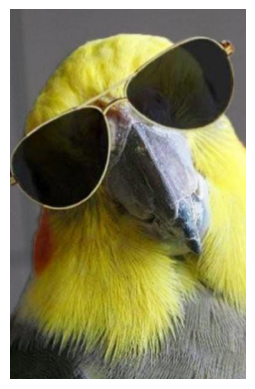

In [17]:
display_image(image_uri)

In [18]:
# Copy and Paste
with open('image_data.json', 'r') as file:
    image_data = json.load(file)
    
def search_by_tag(tag, image_data):
    matching_images = [path for path, details in image_data.items() if tag in details['tags']]
    
    for image_uri in matching_images:
        image = Image.open(image_uri)
        plt.imshow(image)
        plt.axis('off')
        plt.show()

In [19]:
image_data

{'Images\\1548d06a49fccb050deaf74b443a0a59.jpg': {'description': 'A close-up image of a parrot with yellow feathers on its head and grey feathers on its body, wearing a pair of aviator sunglasses.',
  'tags': ['parrot',
   'bird',
   'sunglasses',
   'aviator sunglasses',
   'close-up',
   'yellow feathers',
   'grey feathers',
   'cool',
   'funny']},
 'Images\\600px-Tucano-de-bico-preto_do_Parque_Nacional_da_Amazônia.jpg': {'description': 'A toucan with a large black beak and vibrant blue and yellow markings on its face is perched on a tree branch surrounded by green leaves.',
  'tags': ['toucan',
   'bird',
   'wildlife',
   'nature',
   'tree',
   'branch',
   'forest',
   'colorful',
   'beak',
   'perched']},
 'Images\\850526cb36a67e3548d023a6ac14d7ec.jpg': {'description': 'A close-up image of a bird with wild, spiky feathers on its head and a surprised expression. The background is a blurred green, likely foliage.',
  'tags': ['bird',
   'close-up',
   'wild feathers',
   'spiky

In [25]:
search_by_tag("goofy", image_data)

In [3]:
model_name = "ViT-g-14"
checkpoint = "laion2b_s34b_b88k"
clip_embd = OpenCLIPEmbeddings(model_name=model_name, checkpoint=checkpoint)

C:\Users\emily.lynn\OneDrive - Slalom\Documents\Presentations\Dev Up\dev_ds\lib\site-packages\open_clip\factory.py:129: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpo

In [26]:
clip_embd

OpenCLIPEmbeddings(model=CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 1408, kernel_size=(14, 14), stride=(14, 14), bias=False)
    (patch_dropout): Identity()
    (ln_pre): LayerNorm((1408,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): ModuleList(
        (0-39): 40 x ResidualAttentionBlock(
          (ln_1): LayerNorm((1408,), eps=1e-05, elementwise_affine=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=1408, out_features=1408, bias=True)
          )
          (ls_1): Identity()
          (ln_2): LayerNorm((1408,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=1408, out_features=6144, bias=True)
            (gelu): GELU(approximate='none')
            (c_proj): Linear(in_features=6144, out_features=1408, bias=True)
          )
          (ls_2): Identity()
        )
      )
    )
    (ln_post): LayerNorm((140

In [27]:
# Load the image vectors
with open('image_vectors.json', 'r') as file:
    image_vectors_json = json.load(file)
    
image_vectors = list(image_vectors_json.values())
image_uris = list(image_vectors_json.keys())

print(image_vectors[0])

[-0.02149762213230133, 0.021951809525489807, -0.03716243430972099, 0.01655275747179985, 0.01976323500275612, 0.017215406522154808, -0.011026652529835701, 0.0037407472264021635, -0.026849662885069847, 0.06402450799942017, -0.006236241199076176, 0.005138401407748461, 0.013164980337023735, 0.0008353481534868479, 0.01872362196445465, 0.0063811675645411015, -0.016873925924301147, 0.05318961292505264, 0.013760912232100964, 0.022540230304002762, 0.039307981729507446, -0.028852488845586777, -0.012332267127931118, -0.030955053865909576, 0.0417485386133194, -0.003427405608817935, 0.0051943473517894745, 0.005985495168715715, 0.0035694343969225883, -0.03452751412987709, 0.01607680134475231, -0.021735824644565582, -0.0058862194418907166, 0.03941383212804794, -0.021221023052930832, -0.017361830919981003, -0.012740898877382278, -0.0927462950348854, 0.006967019755393267, -0.0034367116168141365, -0.003460184670984745, 0.0702352449297905, 0.012694530189037323, 0.006526673678308725, 0.013096806593239307,

In [29]:
query = "funny bird"
query_vector = clip_embd.embed_documents([query])
print(query_vector)

[[-0.023754702880978584, 0.00452071288600564, 0.04080920293927193, -0.09264715015888214, -0.014911815524101257, 0.0015906220069155097, -0.001967847580090165, -0.02721460349857807, -0.03058633580803871, 0.02525000460445881, -0.007889285683631897, 0.003639922710135579, -0.03802420198917389, -0.008053644560277462, -0.013013385236263275, -0.01555814128369093, 0.04013180360198021, 0.007978306151926517, 0.001159361214376986, 0.04191677272319794, 0.04351486638188362, -0.0052586025558412075, -0.0023120080586522818, -0.04091378673911095, 0.015404877252876759, -0.011596101336181164, 0.02530164085328579, -0.017089085653424263, -0.0038519457448273897, -0.02354804240167141, 0.042714547365903854, 0.032592546194791794, -0.03951622545719147, 0.026190081611275673, 0.008375512436032295, -0.01461533922702074, -0.0016079015331342816, -0.02931934781372547, -0.03161528706550598, 0.0023968524765223265, 0.014612236060202122, 0.07808727025985718, -0.02179945819079876, -0.018059615045785904, 0.00714586535468697

In [30]:
def search_images(query_vector, image_vectors):
    #query_vector = np.array(query_vector)
    similarities = cosine_similarity(query_vector, image_vectors)[0]
    sorted_indices = np.argsort(similarities)[::-1]
    return sorted_indices, similarities

def display_images_with_scores(image_uris, scores, sorted_indices):
    plt.figure(figsize=(5, len(sorted_indices) * 3))
    
    for i, idx in enumerate(sorted_indices):
        img = mpimg.imread(image_uris[idx])
        
        # Display image
        plt.subplot(len(sorted_indices), 1, i + 1)
        plt.imshow(img)
        plt.title(f"Score: {scores[i]:.2f}")
        plt.axis('off')  # Hide axes
    
    plt.tight_layout()
    plt.show()

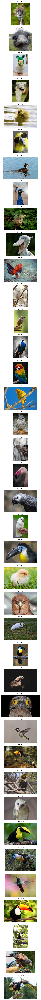

In [33]:
query = "bad hair day"
query_vector = clip_embd.embed_documents([query])
sorted_images, scores = search_images(query_vector, image_vectors)
display_images_with_scores(image_uris, scores[sorted_images], sorted_images)

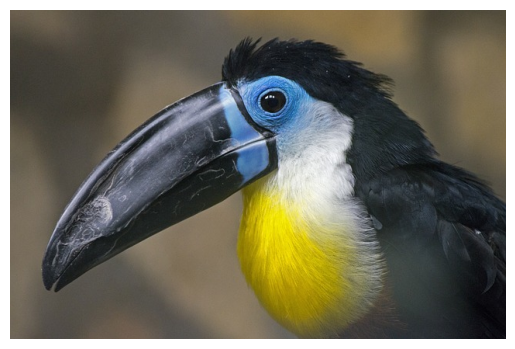

In [34]:
display_image("./Images/toucan-4185361_640.jpg")

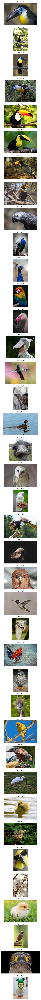

In [35]:
query = "./Images/toucan-4185361_640.jpg"
query_vector = clip_embd.embed_image([query])
sorted_images, scores = search_images(query_vector, image_vectors)
display_images_with_scores(image_uris, scores[sorted_images], sorted_images)